In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import glob
import random
import os

import torch
import torchvision
from torchvision import transforms, models

import sklearn
from sklearn.metrics.pairwise import cosine_similarity

%matplotlib inline

In [2]:
DATA_PATH = "data/sentinel_kaggle/"
DEV_PATH = "data/proc_data"

In [3]:
def draw_keypoints(img1_path, img2_path):
    sift = cv2.SIFT_create()
    
    # Load images
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Detect keypoints and compute descriptors
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Match descriptors
    bf = cv2.BFMatcher()
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Draw first 20 matches
    result = cv2.drawMatches(img1, kp1, img2, kp2, matches[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Display the result
    plt.figure(figsize=(15, 20))
    plt.imshow(result, cmap='gray')
    plt.axis("off")
    plt.show()

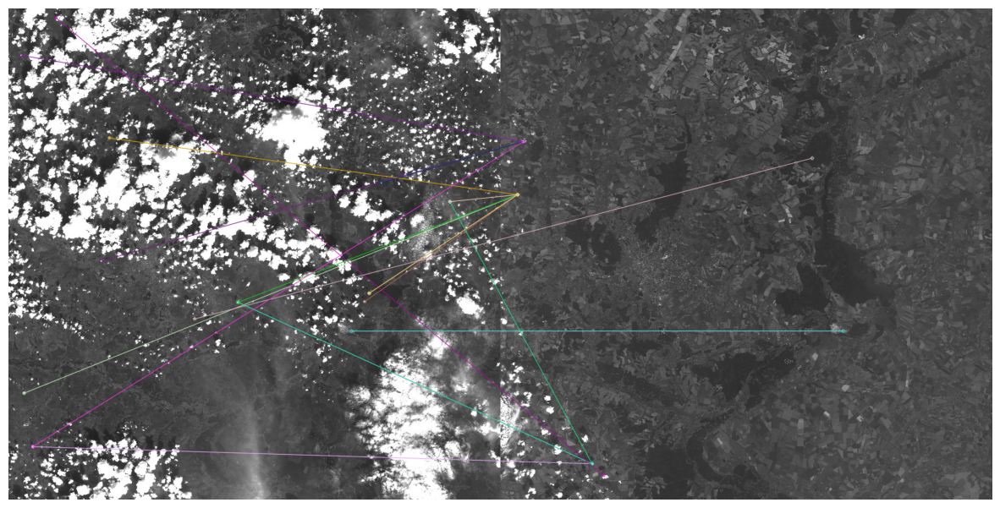

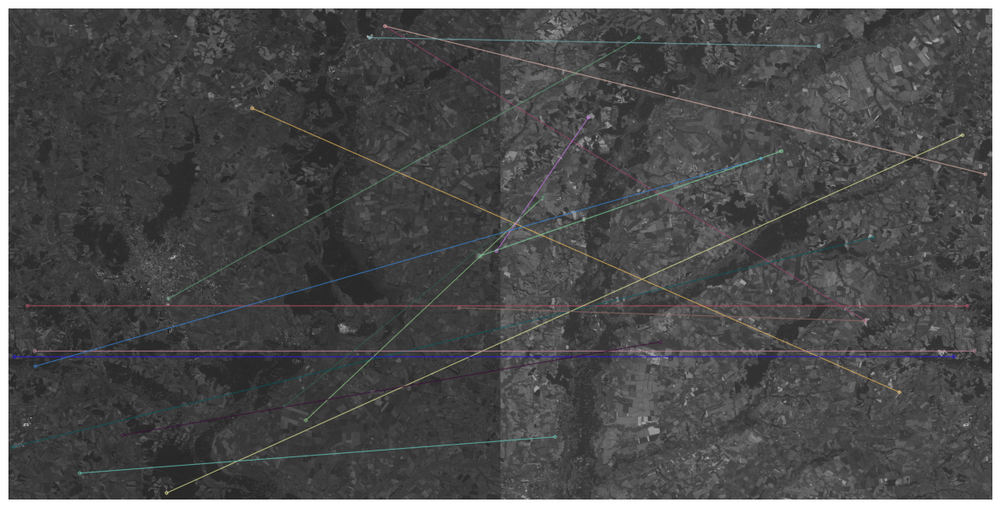

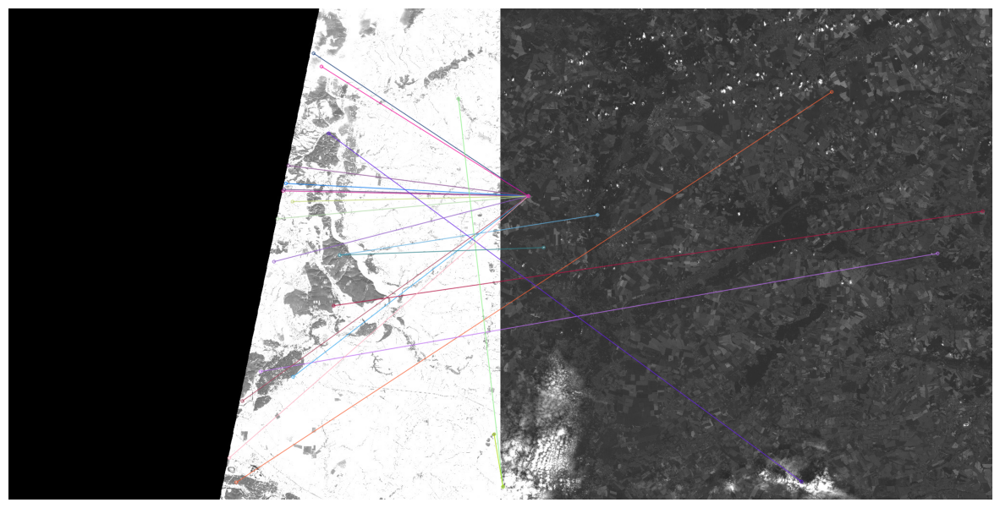

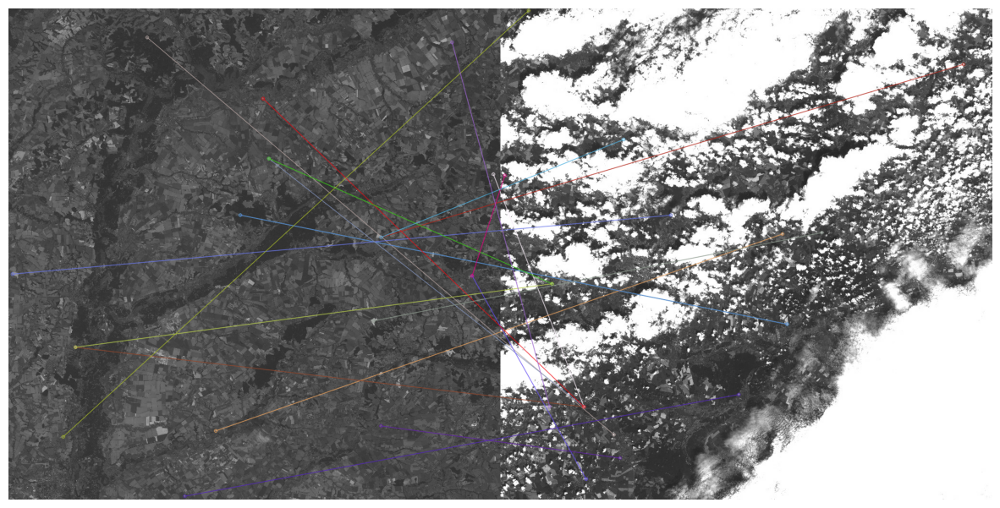

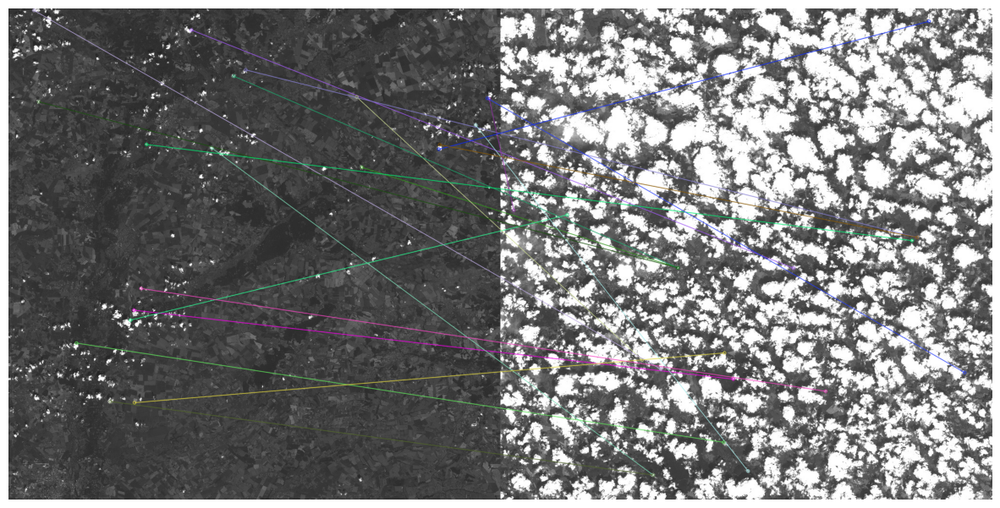

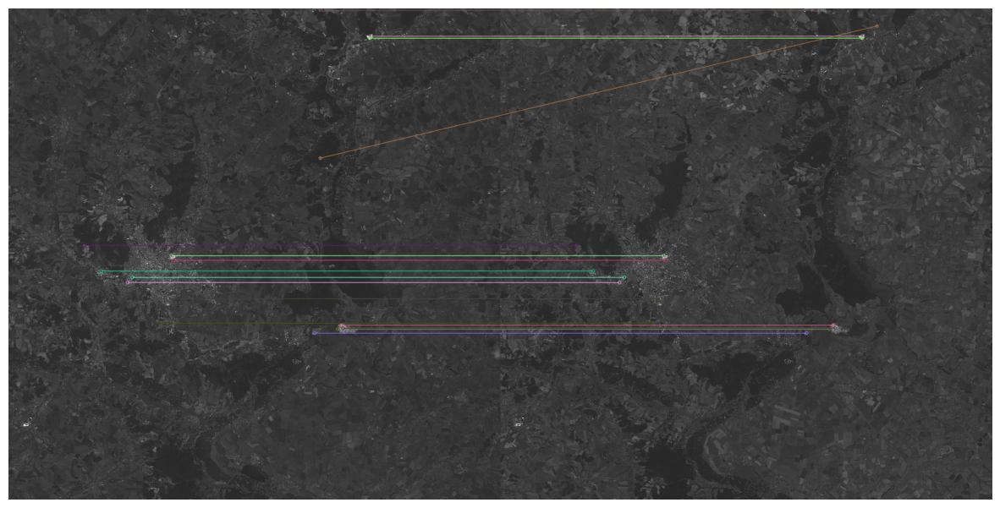

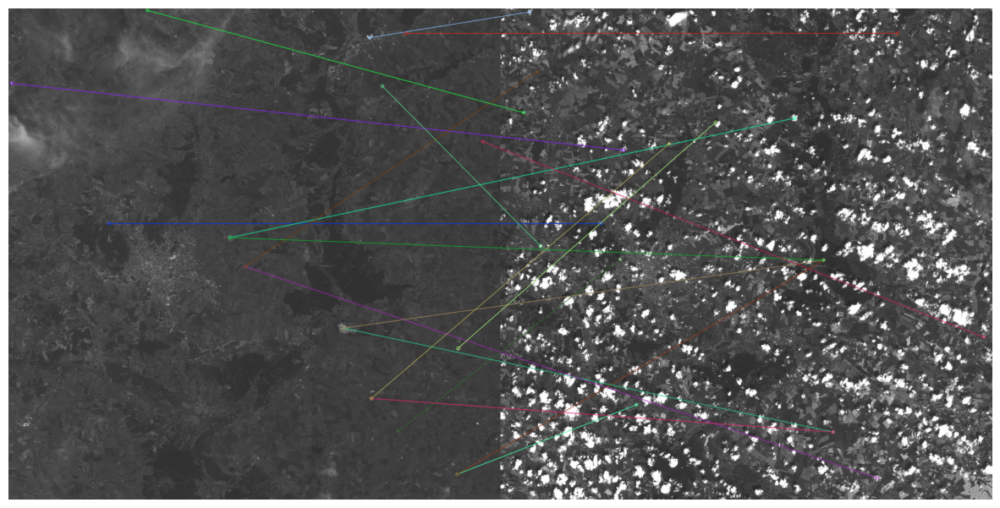

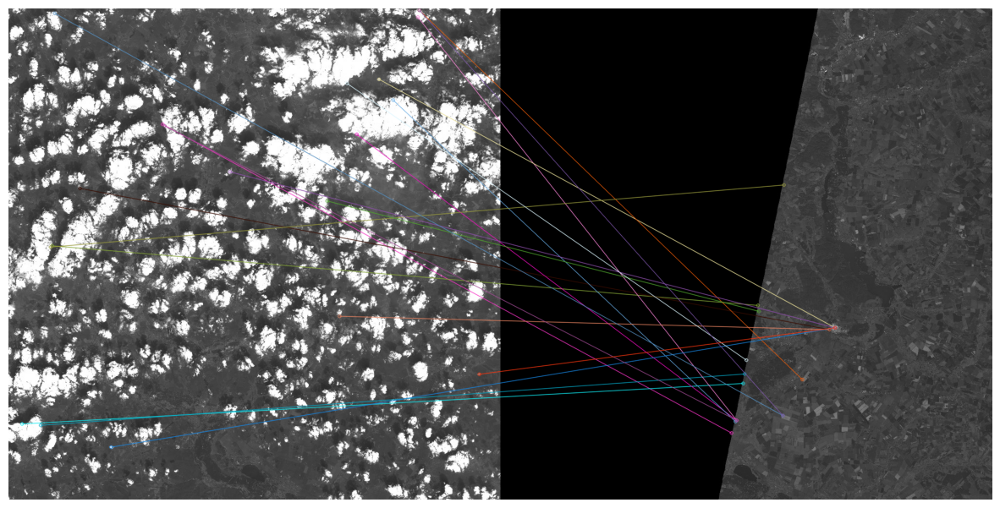

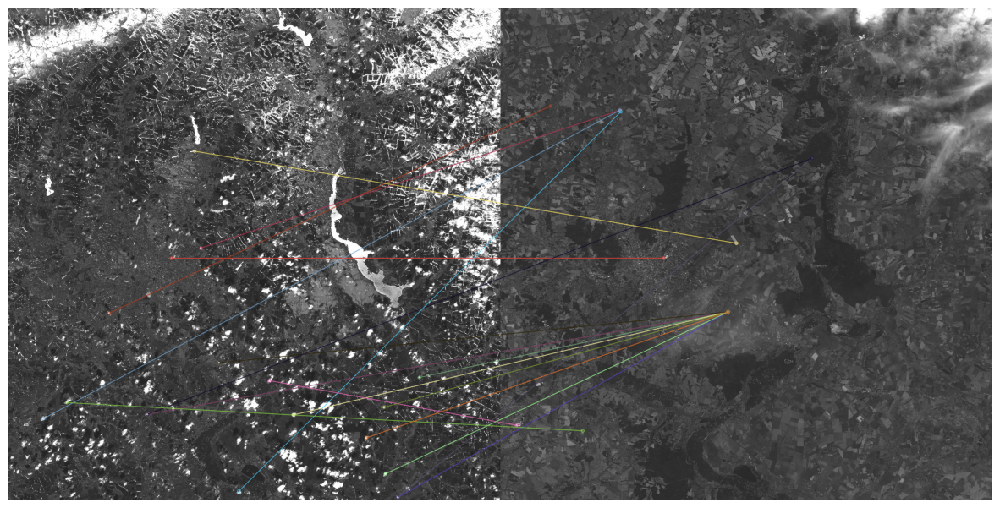

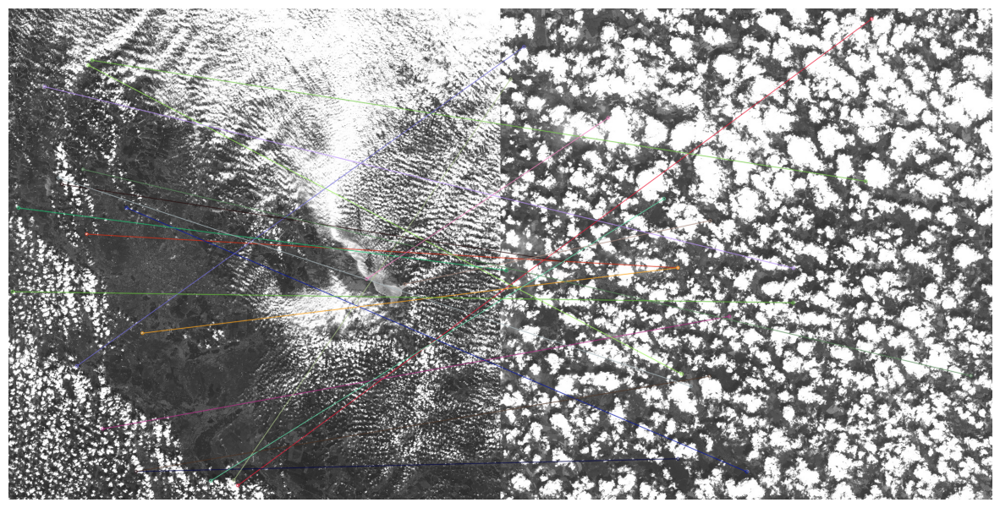

In [4]:
images_path = glob.glob(os.path.join(DEV_PATH, "*/*"))

for _ in range(10):
    image_a = random.choice(images_path)
    image_b = random.choice(images_path)
    
    draw_keypoints(image_a, image_b)

In [5]:
r_image_path = random.choice(images_path)

In [6]:
# Define transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load a sample image
image = cv2.imread(r_image_path)
image = transform(image).unsqueeze(0)  # Add batch dimension

# Load pre-trained ResNet model
model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT, progress=True)
model.fc = torch.nn.Identity()

model.eval()  # Set to evaluation mode

# Perform inference
with torch.inference_mode():
    output = model(image)

output, output.shape

(tensor([[0.0402, 0.2744, 0.0240,  ..., 0.0000, 0.0000, 0.0000]]),
 torch.Size([1, 2048]))

In [7]:
def image_similarity(img1_path, img2_path):
    # Define transformations
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((224, 224)),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    
    # Load pre-trained ResNet model
    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT, progress=True)
    
    model.avgpool = torch.nn.Identity()
    model.fc = torch.nn.Identity() # Change the last clf layer to Identity to get rid of it and get images features

    
    model.eval()  # Set to evaluation mode
    
    # Load images
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    # Transform images
    img1 = transform(img1).unsqueeze(0)
    img2 = transform(img2).unsqueeze(0)
       
    # Perform inference
    with torch.inference_mode():
        img1_output = model(img1).numpy().reshape(1, -1)
        img2_output = model(img2).numpy().reshape(1, -1)
    
    similarity_score = cosine_similarity(img1_output, img2_output)
    
    return similarity_score

In [8]:
image_a = random.choice(images_path)
image_b = random.choice(images_path)

In [9]:
image_similarity(image_a, image_b)

array([[0.23915245]], dtype=float32)

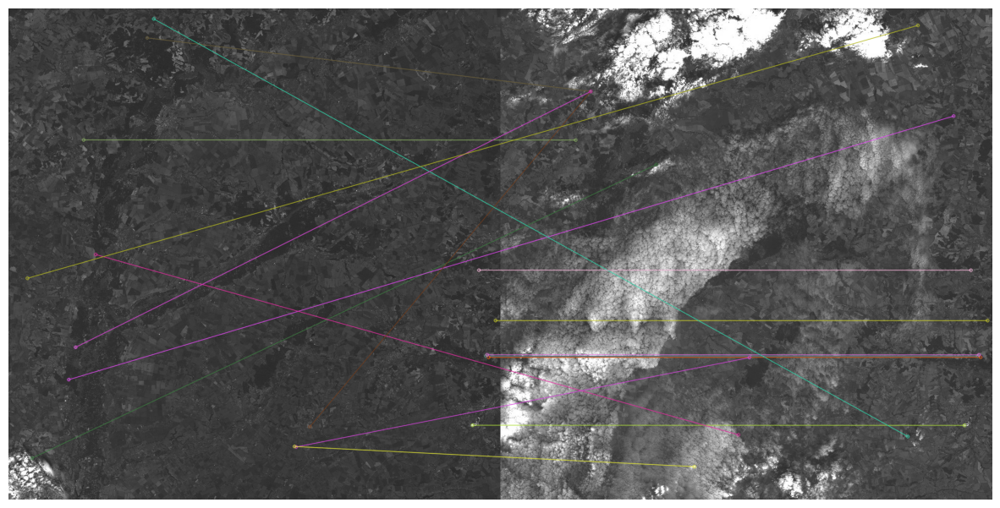

In [10]:
draw_keypoints(image_a, image_b)

In [11]:
image_a = random.choice(images_path)
image_b = random.choice(images_path)

In [12]:
image_similarity(image_a, image_b)

array([[0.46511447]], dtype=float32)

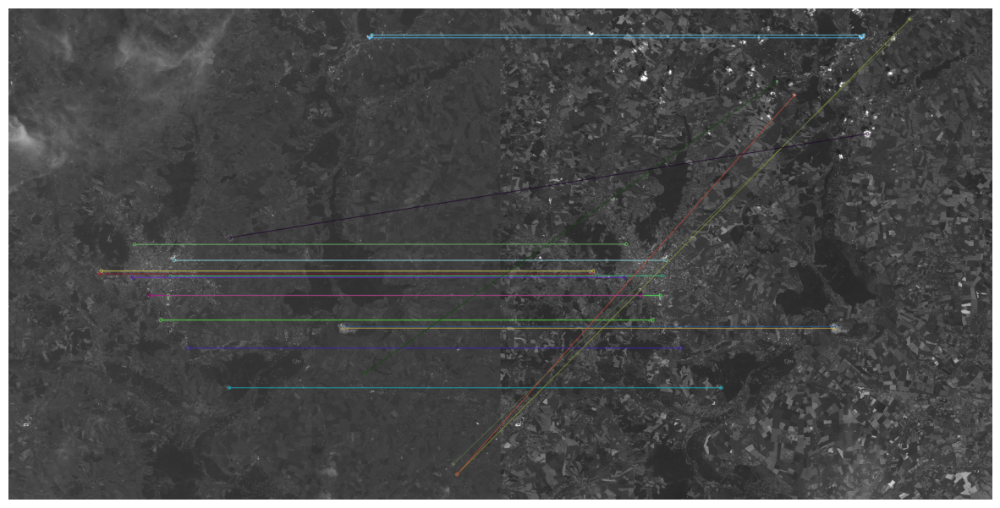

In [13]:
draw_keypoints(image_a, image_b)

In [21]:
def inference(img1_path, img2_path, threshold=0.45):
    image_sim_score = image_similarity(img1_path, img2_path)[0, 0]
    
    if image_sim_score > threshold:
        print("The images are maching!!!")
    else:
        print("The images are not matching(")
    
    draw_keypoints(img1_path, img2_path)

In [22]:
image_a = random.choice(images_path)
image_b = random.choice(images_path)

The images are not matching(


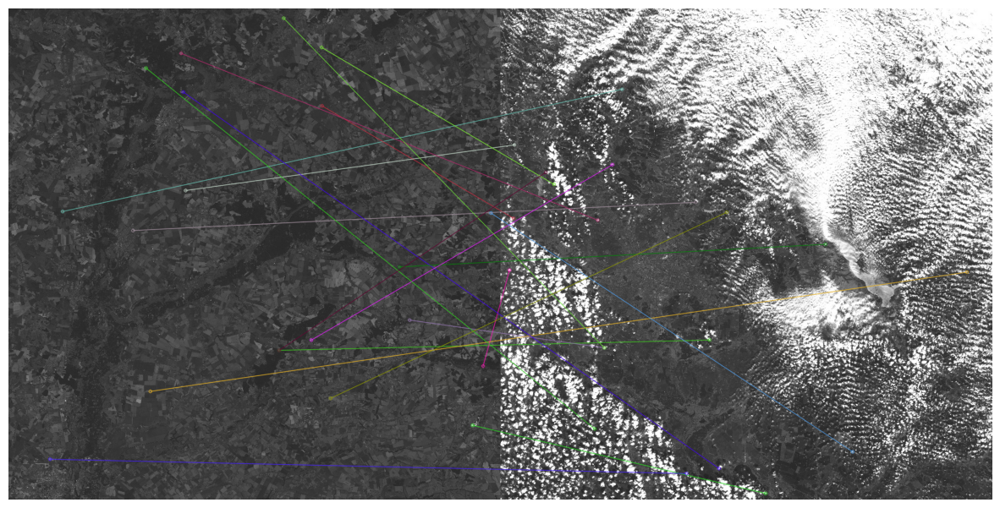

In [23]:
inference(image_a, image_b)

In [36]:
image_a = random.choice(images_path)
image_b = random.choice(images_path)

The images are maching!!!


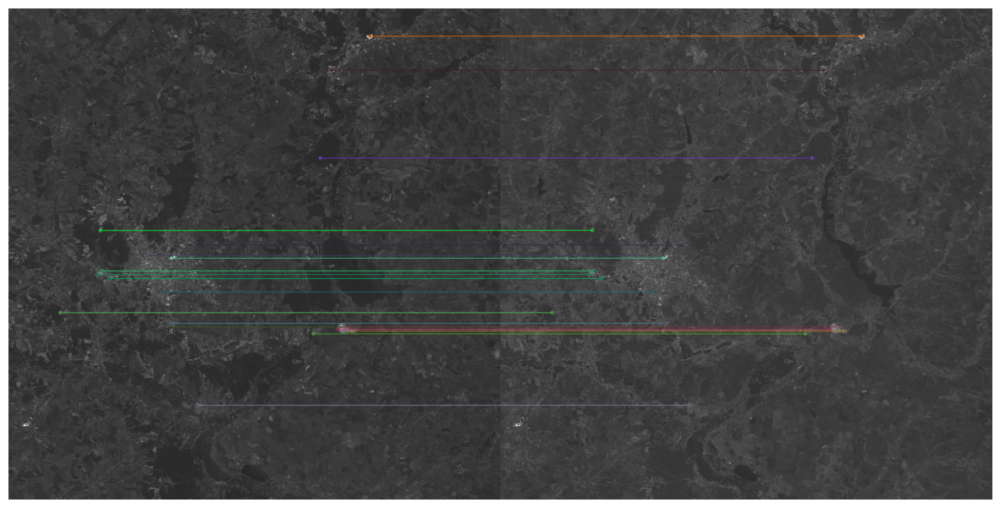

In [37]:
inference(image_a, image_b)

In [34]:
image_a = random.choice(images_path)
image_b = random.choice(images_path)

The images are maching!!!


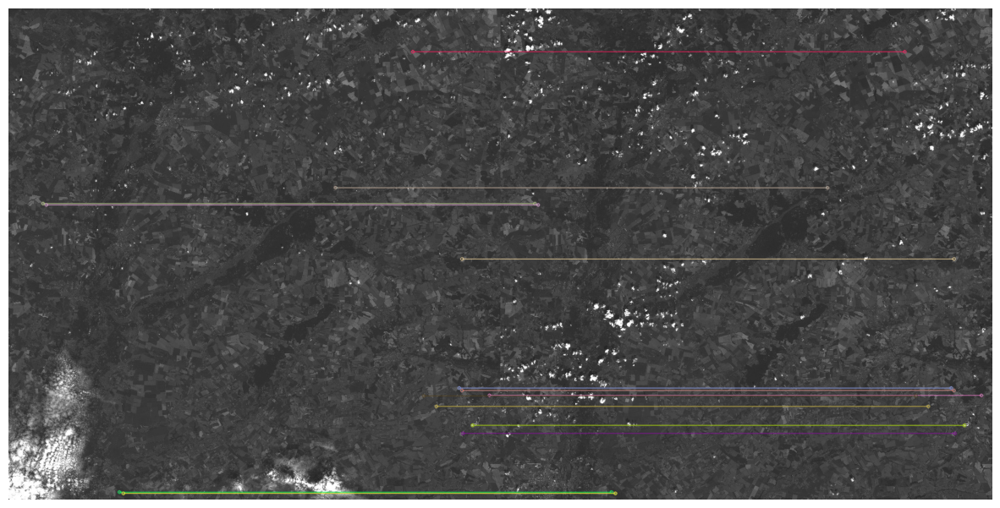

In [35]:
inference(image_a, image_b)

In [2]:
glob.glob("images_to_choose/*")

['images_to_choose/T36UXA_20180805T083559_TCI.jpg',
 'images_to_choose/T36UYA_20190601T083609_TCI.jpg',
 'images_to_choose/T36UXA_20190427T083601_TCI.jpg',
 'images_to_choose/T36UYA_20190621T083609_TCI.jpg',
 'images_to_choose/T36UXA_20180919T083621_TCI.jpg',
 'images_to_choose/T36UYA_20190412T083609_TCI.jpg',
 'images_to_choose/T36UXA_20180731T083601_TCI.jpg',
 'images_to_choose/T36UXA_20180904T083549_TCI.jpg',
 'images_to_choose/T36UYA_20190402T083559_TCI.jpg',
 'images_to_choose/T36UXA_20180825T083549_TCI.jpg',
 'images_to_choose/T36UYA_20190721T083609_TCI.jpg',
 'images_to_choose/T36UYA_20190422T083609_TCI.jpg',
 'images_to_choose/T36UXA_20180726T084009_TCI.jpg',
 'images_to_choose/T36UYA_20160502T083602_TCI.jpg',
 'images_to_choose/T36UXA_20180830T083601_TCI.jpg',
 'images_to_choose/T36UXA_20180815T084009_TCI.jpg',
 'images_to_choose/T36UYA_20190810T083609_TCI.jpg',
 'images_to_choose/T36UYA_20190701T083609_TCI.jpg',
 'images_to_choose/T36UYA_20160330T082542_TCI.jpg',
 'images_to_